# Implement Logic and run()
# A* search algorithm

In [16]:
import pkg_resources
pkg_resources.require("osmnx==1.2.2")
                      
import osmnx as ox
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
ox.settings.log_console=True
ox.__version__

'1.2.2'

# Define plot_graph classes
This implementations are modifications over origianl OSMnx classes
* plot_graph_route()
* plot_graph_routes()

In [103]:
def plot_graph_routeNog(
    G,
    route,
    route_color="r",
    route_linewidth=4,
    route_alpha=0.5,
    orig_dest_size=100,
    ax=None,
    root_node=None,
    target_node=None,
    **pg_kwargs,
):
    if ax is None:
        # plot the graph but not the route, and override any user show/close
        # args for now: we'll do that later
        override = {"show", "save", "close"}
        kwargs = {k: v for k, v in pg_kwargs.items() if k not in override}
        fig, ax = ox.plot_graph(G, show=False, save=False, close=False, **kwargs)
    else:
        fig = ax.figure

    # scatterplot origin and destination points (first/last nodes in route)
    x = (G.nodes[route[0]]["x"], G.nodes[route[-1]]["x"])
    y = (G.nodes[route[0]]["y"], G.nodes[route[-1]]["y"])
    ax.scatter(x, y, s=orig_dest_size, c=route_color, alpha=route_alpha, edgecolor="none")

    # assemble the route edge geometries' x and y coords then plot the line
    x = []
    y = []
    
    my_i=0
    my_color=['b','g','r','c','m','y','k','w']
    
    
    
    
    for u, v in zip(route[:-1], route[1:]):
        # if there are parallel edges, select the shortest in length
        data = min(G.get_edge_data(u, v).values(), key=lambda d: d["length"])
        
        if "geometry" in data:
            # if geometry attribute exists, add all its coords to list
            xs, ys = data["geometry"].xy
            x.extend(xs)
            y.extend(ys)
            
            ax.plot(xs, ys, c=route_color, lw=route_linewidth, alpha=route_alpha)
        else:
            # otherwise, the edge is a straight line from node to node
            x.extend((G.nodes[u]["x"], G.nodes[v]["x"]))
            y.extend((G.nodes[u]["y"], G.nodes[v]["y"]))
            
        my_i=my_i+1
            
    #ax.plot(x[:int(len(x)/2)], y[:int(len(y)/2)], c='g', lw=route_linewidth, alpha=1)
    #ax.plot(x[int(len(x)/2)-1:], y[int(len(y)/2)-1:], c='r', lw=route_linewidth, alpha=1)

    # save and show the figure as specified, passing relevant kwargs
    sas_kwargs = {"save", "show", "close", "filepath", "file_format", "dpi"}
    kwargs = {k: v for k, v in pg_kwargs.items() if k in sas_kwargs}
    fig, ax = ox.plot._save_and_show(fig, ax, **kwargs)
    return fig, ax

In [104]:
def plot_graph_routesNog(
    G,
    routes,
    route_colors="r",
    route_linewidths=4,
    reachTarget=None,
    **pgr_kwargs
):
    
    
    """
    Plot several routes along a graph.
    Parameters
    ----------
    G : networkx.MultiDiGraph
        input graph
    routes : list
        routes as a list of lists of node IDs
    route_colors : string or list
        if string, 1 color for all routes. if list, the colors for each route.
    route_linewidths : int or list
        if int, 1 linewidth for all routes. if list, the linewidth for each route.
    pgr_kwargs
        keyword arguments to pass to plot_graph_route
    Returns
    -------
    fig, ax : tuple
        matplotlib figure, axis
    """
    # check for valid arguments
    if not all(isinstance(r, list) for r in routes):  # pragma: no cover
        raise ValueError("routes must be a list of route lists")
    if len(routes) < 2:  # pragma: no cover
        raise ValueError("You must pass more than 1 route")
    if isinstance(route_colors, str):
        route_colors = [route_colors] * len(routes)
    if len(routes) != len(route_colors):  # pragma: no cover
        raise ValueError("route_colors list must have same length as routes")
    if isinstance(route_linewidths, int):
        route_linewidths = [route_linewidths] * len(routes)
    if len(routes) != len(route_linewidths):  # pragma: no cover
        raise ValueError("route_linewidths list must have same length as routes")
        
    
    orig_dest_nodes_heading_the_routes = False
    orig_dest_size_backup = pgr_kwargs["orig_dest_size"]
    pgr_kwargs["orig_dest_size"] = 0
    
    
    
    if ("plot_orig_dest_nodes" in pgr_kwargs):
                if (pgr_kwargs["plot_orig_dest_nodes"] == True):
                    pgr_kwargs["orig_dest_size"] = orig_dest_size_backup
                    
                del pgr_kwargs["plot_orig_dest_nodes"]
                
                
            
    orig_dest_size_backup = pgr_kwargs["orig_dest_size"]
    override = {"route", "route_color", "route_linewidth", "show", "save", "close"}
    kwargs = {k: v for k, v in pgr_kwargs.items() if k not in override}
    fig = None
    ax = None
    
    
    current_rout_plot_count = 0
    r_rc_rlw = zip(routes, route_colors, route_linewidths)
    for route, route_color, route_linewidth in r_rc_rlw:
        current_rout_plot_count = current_rout_plot_count + 1
        
        if (current_rout_plot_count>2):
            kwargs["orig_dest_size"] = 0
            
            
        if (current_rout_plot_count==len(routes)):
            if (reachTarget==True):
                route_color = "y"
                
        
        fig, ax = plot_graph_routeNog(
            G,
            route=route,
            route_color=route_color,
            route_linewidth=route_linewidth,
            show=False,
            save=False,
            close=False,
            ax=ax,
            **kwargs,
        )       


    # save and show the figure as specified, passing relevant kwargs
    sas_kwargs = {"save", "show", "close", "filepath", "file_format", "dpi"}
    kwargs = {k: v for k, v in pgr_kwargs.items() if k in sas_kwargs}
    fig, ax = ox.plot._save_and_show(fig, ax, **kwargs)
    return fig, ax

## Load Graph visuals
Load MultiDiGraph saved on disk. It will support all Graph visualization


In [105]:
path="bigScale_DataSet/graph/"
G = ox.load_graphml(path+'my_graph')
#fig, ax = ox.plot_graph(G, node_size=0)

In [106]:
# convert your MultiDiGraph to an undirected MultiGraph
M = ox.utils_graph.get_undirected(G)

## Load GeoPandas dataframe
Load GeoPandas dataframe saved on disk. It will provide all the data that the algorithm needs to work properly

In [107]:
path="bigScale_DataSet/geoPandas_dataFrame/"
gdf_edges = pd.read_csv(path+'gdf_edges_final.csv',index_col=["u","v","key"])
gdf_nodes = pd.read_csv(path+'gdf_nodes_final.csv',index_col=["node_id"],float_precision='round_trip')

# Algoritimo A*

## Defining Node class

In [108]:
class Node:
    def __init__(self, osmid, gc_distance):
        #gc_ditance = great_cricle distance
        self.gc_distance=gc_distance
        
        #node unique id
        self.osmid=osmid
        
        #adjacentNodes={"adj_osmid":distance}
        self.adjacentNodes = {};

        
    def addAdjacentNode(self, newAdjacentNode, length):
        if newAdjacentNode.osmid not in self.adjacentNodes:
            newAdj_osmid=newAdjacentNode.osmid
            self.adjacentNodes[newAdj_osmid]=length

## Creating graphNodes dictionary

In [109]:
graphNodes={}

In [110]:
for index in gdf_nodes.index:
    if index not in graphNodes:
        gc_distance=gdf_nodes.loc[index]["gc_distance"]
        osmid=index
        graphNodes[osmid]=(Node(osmid,gc_distance))

In [111]:
len(graphNodes)

1431

## Adding respective adjacencies to each Node
-Add adjacencies<br>
-Add node to node distance


In [112]:
for index in gdf_edges.index:
    osmid_u=index[0]
    osmid_v=index[1]
    
    distance_uv = gdf_edges.loc[index].length
    
    graphNodes[osmid_u].addAdjacentNode(graphNodes[osmid_v],distance_uv)
    graphNodes[osmid_v].addAdjacentNode(graphNodes[osmid_u], distance_uv)

In [113]:
len(graphNodes)

1431

In [114]:
import numpy as np
import os

from IPython.display import Image

from shutil import copyfile
import shutil

import copy

## Defining AStar class

In [115]:
class AStar:
    def __init__(self, root_osmid, graphNodes, show_plots=False, plot_orig_dest_nodes=False, dpi=100):
        self.graphNodes= graphNodes
        self.tree= {root_osmid:{"pai":-1}}
        self.root_osmid= root_osmid
        self.show_plots= show_plots
        self.dpi= dpi
        
        #Target is a fixed node, for now...
        self.target_osmid=self.getTarget()
        self.current_node=root_osmid
        
        self.saveIteration=0
        self.allRoutes=[]
        self.plot_orig_dest_nodes = plot_orig_dest_nodes
        
        #Register Algo Progress
        self.initialGC=-1
        self.currentGC=-1
        
        #Plots path directory
        self.path_astarPlots="bigScale_PlotResults/astarPlots/"
        
        #Register Tree evolution
        self.treeHistory=[]
        
        
    
    def call_plot_graph(self):

        if len(self.allRoutes)<=1:
            if self.plot_orig_dest_nodes==True:
                self.allRoutes = [[self.root_osmid]] + [[self.target_osmid]] + self.allRoutes
            else:
                plot_graph_routeNog(M, *self.allRoutes,
                                 node_size=0,
                                 edge_linewidth=1,
                                 route_linewidth=2,
                                 route_alpha=1,
                                 save=True,
                                 dpi=self.dpi,
                                 show=self.show_plots,
                                 orig_dest_size=0,
                                 filepath=self.path_astarPlots+"astar"+str(self.saveIteration)+"_0.png",
                                 )
            
        if len(self.allRoutes)>1:
            if self.reachTarget==True:
                full_finished_route = self.allRoutes[-1]
                full_finished_route_inverted = full_finished_route[::-1]
                
                steps_finished_route = []
                for node_i in range(1,len(full_finished_route_inverted)+1):
                    step = full_finished_route_inverted[0:node_i]
                    steps_finished_route.append(step)

                for step in steps_finished_route:  

                    plot_graph_routesNog(M, self.allRoutes+[step],
                                 node_size=0,
                                 edge_linewidth=1,
                                 route_linewidths=2,
                                 route_alpha=1,
                                 save=True,
                                 dpi=self.dpi,
                                 show=self.show_plots,
                                 filepath=self.path_astarPlots+"astar"+str(self.saveIteration)+"_0.png",
                                 orig_dest_size=100,
                                 plot_orig_dest_nodes = self.plot_orig_dest_nodes,
                                 reachTarget = self.reachTarget
                                )
                    
                    self.saveIteration=self.saveIteration+1

            plot_graph_routesNog(M, self.allRoutes,
                                 node_size=0,
                                 edge_linewidth=1,
                                 route_linewidths=2,
                                 route_alpha=1,
                                 save=True,
                                 dpi=self.dpi,
                                 show=self.show_plots,
                                 filepath=self.path_astarPlots+"astar"+str(self.saveIteration)+"_0.png",
                                 orig_dest_size=100,
                                 plot_orig_dest_nodes = self.plot_orig_dest_nodes,
                                 reachTarget = self.reachTarget
                                )
                    
    
    def clearDirectory(self,folder):
        for filename in os.listdir(folder):
            file_path = os.path.join(folder, filename)
            try:
                if os.path.isfile(file_path) or os.path.islink(file_path):
                    os.unlink(file_path)
                elif os.path.isdir(file_path):
                    shutil.rmtree(file_path)
            except Exception as e:
                print('Failed to delete %s. Reason: %s' % (file_path, e))
                
    
    def getTarget(self):
        for osmid in self.graphNodes:
            if graphNodes[osmid].gc_distance==0:
                return osmid
    
    def gotoNode(self, next_node):
        current_node=next_node
        self.tree[current_node]["state"]="closed"
        return current_node
        
        
        ##Add check if its final point
            ##If not, repeate all process again
                ##OpenAdjNodes
                ##min_f
                ##gotoNode
        
    def openAdjNodes(self, node_osmid):
        for ajdNode_osmid in graphNodes[node_osmid].adjacentNodes:
            if ajdNode_osmid not in self.tree:
                self.tree[ajdNode_osmid]={"pai":node_osmid,"state":"opened"}
    
    ## x=node_osmid
    def g(self, x):
        gx=0
        
        route=[]
        
        current_osmid=x
        
        route=[current_osmid]
        while(self.tree[current_osmid]["pai"]!=-1):
            pai=self.tree[current_osmid]["pai"]
            length=graphNodes[pai].adjacentNodes[current_osmid]
            gx=gx+length
            
            route.append(pai)
            
            current_osmid=pai

            
        
        
        return (gx,route)
     
    def h(self, x):
        hx = graphNodes[x].gc_distance
        
        return hx
    
    
    
    def f(self, x):
        fx= self.g(x)[0] + self.h(x)
        
        ##Print Progess 
        if self.initialGC==-1:
            self.initialGC=self.h(x)
            self.currentGC=self.h(x)
        elif self.currentGC>self.h(x):
            self.currentGC=self.h(x)
            print("Progress: "+str(round(100-(100*self.currentGC/self.initialGC),2))+"%")
            
        return (fx,self.g(x)[1])
    
    def min_fx(self):
        minfx=-1
        minfx_osmid=-1
        route=[]
        for osmid in self.tree:
            state=aStar.tree[osmid]["state"]
            if state == "opened":
                fx= self.f(osmid)
                
                if((fx[0]<minfx)or minfx<0):
                    minfx=fx[0]
                    minfx_osmid=osmid
                    
                    route=fx[1]
                    
                    
        self.saveIteration=self.saveIteration+1
        
        self.allRoutes.append(route)

        return (minfx_osmid, route)
    
    def run(self):
        self.clearDirectory(self.path_astarPlots)
        
        next_node=self.root_osmid
        
        self.reachTarget=False
        
        while self.reachTarget==False:
            current_node=self.gotoNode(next_node)
            self.treeHistory.append(copy.deepcopy(self.tree))
            
            if current_node==self.target_osmid:
                self.reachTarget=True
                
            else:
                self.openAdjNodes(current_node)
                self.treeHistory.append(copy.deepcopy(self.tree))
                
                min_fx=self.min_fx()
                min_fx_osmid=min_fx[0]
                
                next_node=min_fx_osmid
                
            self.call_plot_graph()
        
        print("Finished.")
                
        return self.treeHistory
        
                

## AStar__init__() 

In [116]:
# Geocode a query string to (lat, lng) with the Nominatim geocoder.
empire_state_address = "20 W 34th St, New York, NY 10001, United States"
root_geocode=ox.geocoder.geocode(empire_state_address)
root_geocode

# Within M network get node nearest from Lat and Lng
root_node = ox.distance.nearest_nodes(M, Y=root_geocode[0], X=root_geocode[1])
root_node

42437644

In [118]:
#halfway 42430338
aStar=AStar(root_osmid=root_node, graphNodes=graphNodes, show_plots=False, plot_orig_dest_nodes=True, dpi=100)

## AStar.run()

In [119]:
aStar_treeHistory=aStar.run()

Progress: 8.64%
Progress: 16.77%
Progress: 24.52%
Progress: 32.22%
Progress: 39.73%
Progress: 47.02%
Progress: 60.44%
Progress: 63.62%
Progress: 73.0%
Progress: 82.79%
Progress: 91.36%
Progress: 100.0%
Finished.


#### Save aStar_treeHistory for further use

In [120]:
#Save aStar_treeHistory dictionary as JSON file
#We use it later on at bigScale_behaviorTree.ipynb to rebuild the behaviourTree

import json

with open('bigScale_behaviorTree/data.json', 'w') as fp:
    json.dump(aStar_treeHistory, fp, indent=4)

## Plot Results

In [98]:
!pip install imageio==2.19.2

In [121]:
#import imageio
import imageio.v2 as imageio
import numpy as np
import os

from IPython.display import Image

from shutil import copyfile

##### Define GIF gennerator


In [122]:
def gennerateGIF():
    path_pathwayPlots="bigScale_PlotResults/astarPlots/"
    path_gifBuilder="bigScale_PlotResults/gifBuilder/"
    path_GIF="bigScale_PlotResults/GIF/"
    filenames = []
    delay=7

    ##Slow gif down    
    i=0
    error=False
    while error==False:
        i=i+1
        try:
            for i2 in range(1,2):
                original= path_pathwayPlots+"astar"+str(i)+"_0.png"
                new_copy= path_gifBuilder+"astar"+str(i)+"_"+str(i2)+".png"

                copyfile(original, new_copy)
                
                #Print Progress
                if i%10==0:
                    print("Copies created: "+str(i))
        except:
            ##Add Pause on finish State
            i=i-1
            for i2 in range(delay,5*delay):
                original= path_pathwayPlots+"astar"+str(i)+"_0.png"
                new_copy= path_gifBuilder+"astar"+str(i)+"_"+str(i2)+".png"
                copyfile(original, new_copy)    
            error=True
            
    print("All Copies created. finished")
    
    # build gif
    with imageio.get_writer(path_GIF+'astarGif3.gif', mode='I') as writer:
        i=0
        error=False
        while error==False:
            i=i+1
            try:
                for i2 in range(1,2):
                    image = imageio.imread(path_gifBuilder+"astar"+str(i)+"_"+str(i2)+".png")
                    writer.append_data(image)
                
                #Print Progress
                if i%10==0:
                    print("Routes added to GIF: "+str(i))
            except:
                ##Add Pause on finish State
                i=i-1
                for i2 in range(delay,5*delay):
                    image = imageio.imread(path_gifBuilder+"astar"+str(i)+"_"+str(i2)+".png")
                    writer.append_data(image)
                error=True

    print("GIF created. finished")
    
    
    # Remove files
    i=0
    error=False
    while error==False:
        i=i+1
        try:
            for i2 in range(1,2):
                os.remove(path_gifBuilder+"astar"+str(i)+"_"+str(i2)+".png")
            
            #Print Progress
                if i%10==0:
                    print("Copies cleaned from directory: "+str(i))
        except:
            ##Add Pause on finish State
            i=i-1
            for i2 in range(delay,5*delay):
                os.remove(path_gifBuilder+"astar"+str(i)+"_"+str(i2)+".png")
            error=True

    print("All Copies removed, directory is clean. finished")

In [123]:
gennerateGIF()

Copies created: 10
Copies created: 20
Copies created: 30
Copies created: 40
Copies created: 50
Copies created: 60
All Copies created. finished
Routes added to GIF: 10
Routes added to GIF: 20
Routes added to GIF: 30
Routes added to GIF: 40
Routes added to GIF: 50
Routes added to GIF: 60
GIF created. finished
Copies cleaned from directory: 10
Copies cleaned from directory: 20
Copies cleaned from directory: 30
Copies cleaned from directory: 40
Copies cleaned from directory: 50
Copies cleaned from directory: 60
All Copies removed, directory is clean. finished


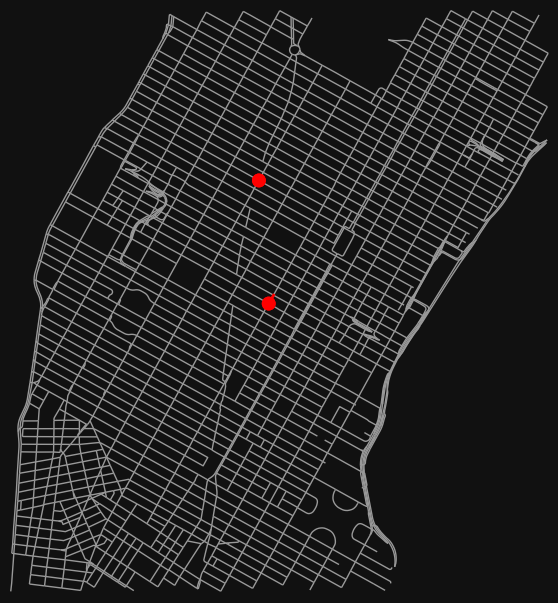

In [125]:
from IPython.display import Image

path_GIF="bigScale_PlotResults/GIF/"

Image(open(path_GIF+'/astarGif3.gif','rb').read())